<a href="https://colab.research.google.com/github/SurajSharma0204/Mygooglecolab-EDA-Stats-Assignments/blob/main/EDA_Assignment_2__23rd__March_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Amazon sales data

#1.What is the average rating for each product category?

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


import warnings
warnings.filterwarnings('ignore')

plt.style.use("fivethirtyeight")
%matplotlib inline

pd.set_option('display.max_columns', 30)

df = pd.read_csv("amazon.csv")

In [ ]:
print(df.columns)

Index(['product_id', 'product_name', 'category', 'discounted_price',
       'actual_price', 'discount_percentage', 'rating', 'rating_count',
       'about_product', 'user_id', 'user_name', 'review_id', 'review_title',
       'review_content', 'img_link', 'product_link'],
      dtype='object')


In [ ]:
df["category"].unique()

array(['Computers&Accessories|Accessories&Peripherals|Cables&Accessories|Cables|USBCables',
       'Computers&Accessories|NetworkingDevices|NetworkAdapters|WirelessUSBAdapters',
       'Electronics|HomeTheater,TV&Video|Accessories|Cables|HDMICables',
       'Electronics|HomeTheater,TV&Video|Televisions|SmartTelevisions',
       'Electronics|HomeTheater,TV&Video|Accessories|RemoteControls',
       'Electronics|HomeTheater,TV&Video|Televisions|StandardTelevisions',
       'Electronics|HomeTheater,TV&Video|Accessories|TVMounts,Stands&Turntables|TVWall&CeilingMounts',
       'Electronics|HomeTheater,TV&Video|Accessories|Cables|RCACables',
       'Electronics|HomeAudio|Accessories|SpeakerAccessories|Mounts',
       'Electronics|HomeTheater,TV&Video|Accessories|Cables|OpticalCables',
       'Electronics|HomeTheater,TV&Video|Projectors',
       'Electronics|HomeAudio|Accessories|Adapters',
       'Electronics|HomeTheater,TV&Video|SatelliteEquipment|SatelliteReceivers',
       'Computers&Acces

In [ ]:
df["category"].value_counts()

category
Computers&Accessories|Accessories&Peripherals|Cables&Accessories|Cables|USBCables                                          233
Electronics|WearableTechnology|SmartWatches                                                                                 76
Electronics|Mobiles&Accessories|Smartphones&BasicMobiles|Smartphones                                                        68
Electronics|HomeTheater,TV&Video|Televisions|SmartTelevisions                                                               63
Electronics|Headphones,Earbuds&Accessories|Headphones|In-Ear                                                                52
                                                                                                                          ... 
Electronics|Cameras&Photography|Accessories|Batteries&Chargers|BatteryChargers                                               1
Computers&Accessories|NetworkingDevices|DataCards&Dongles                                             

In [ ]:
duplicate_rows = df[df.duplicated()]

duplicate_rows = df[df.duplicated(subset=['category'])]

df.duplicated().sum()


0

In [ ]:


# Assuming 'df' is your DataFrame containing the Amazon sales data
# Let's say your DataFrame has columns 'category', 'rating', and other relevant columns

# Convert 'rating' column to numeric, coerce errors to NaN
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

# Drop rows with NaN values in 'rating' column
df = df.dropna(subset=['rating'])

# Group the data by 'product_category' and calculate the average rating
avg_rating_per_category = df.groupby('category')['rating'].mean().reset_index()

print(avg_rating_per_category)



                                              category    rating
0    Car&Motorbike|CarAccessories|InteriorAccessori...  3.800000
1    Computers&Accessories|Accessories&Peripherals|...  4.150000
2    Computers&Accessories|Accessories&Peripherals|...  3.500000
3    Computers&Accessories|Accessories&Peripherals|...  3.600000
4    Computers&Accessories|Accessories&Peripherals|...  4.050000
..                                                 ...       ...
206  OfficeProducts|OfficePaperProducts|Paper|Stati...  4.250000
207  OfficeProducts|OfficePaperProducts|Paper|Stati...  4.150000
208  OfficeProducts|OfficePaperProducts|Paper|Stati...  4.300000
209  OfficeProducts|OfficePaperProducts|Paper|Stati...  4.133333
210  Toys&Games|Arts&Crafts|Drawing&PaintingSupplie...  4.300000

[211 rows x 2 columns]


In [ ]:

import pandas as pd

# Check the data type of the "rating" column
print(df["rating"].dtype)

# If the data type is not numeric, convert it to numeric
if df["rating"].dtype == "object":
    df["rating"] = pd.to_numeric(df["rating"], errors="coerce")  # Handle potential errors

# Calculate the average ratings after ensuring numeric data type
average_ratings = df.groupby("category")["rating"].mean().reset_index()

print(average_ratings)



float64
                                              category    rating
0    Car&Motorbike|CarAccessories|InteriorAccessori...  3.800000
1    Computers&Accessories|Accessories&Peripherals|...  4.150000
2    Computers&Accessories|Accessories&Peripherals|...  3.500000
3    Computers&Accessories|Accessories&Peripherals|...  3.600000
4    Computers&Accessories|Accessories&Peripherals|...  4.050000
..                                                 ...       ...
206  OfficeProducts|OfficePaperProducts|Paper|Stati...  4.250000
207  OfficeProducts|OfficePaperProducts|Paper|Stati...  4.150000
208  OfficeProducts|OfficePaperProducts|Paper|Stati...  4.300000
209  OfficeProducts|OfficePaperProducts|Paper|Stati...  4.133333
210  Toys&Games|Arts&Crafts|Drawing&PaintingSupplie...  4.300000

[211 rows x 2 columns]


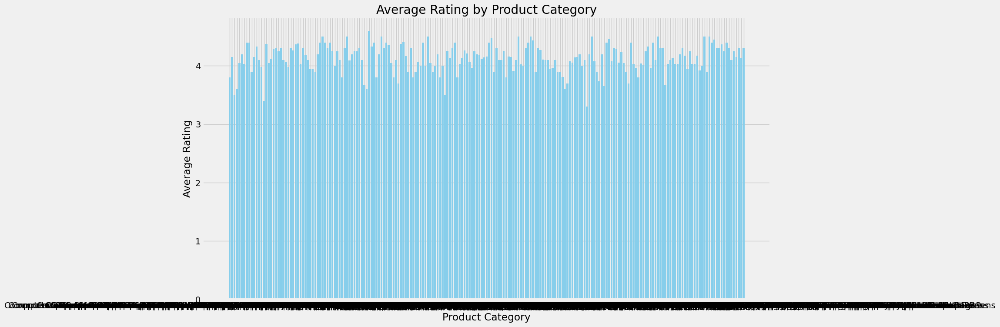

In [ ]:
# Create a bar chart
plt.figure(figsize=(15, 8))
plt.bar(avg_rating_per_category['category'], avg_rating_per_category['rating'], color='skyblue')
plt.xlabel('Product Category')
plt.ylabel('Average Rating')
plt.title('Average Rating by Product Category')
plt.show()

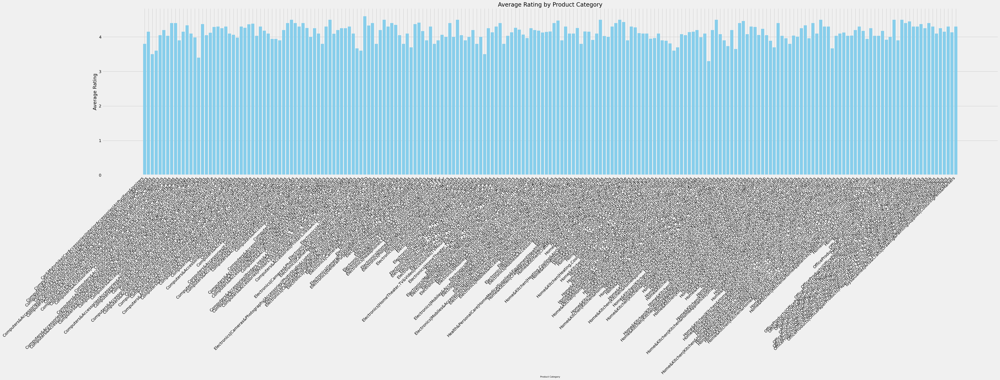

In [ ]:
plt.figure(figsize=(50, 10))  # Increase the figure size
plt.bar(avg_rating_per_category['category'], avg_rating_per_category['rating'], color='skyblue')
plt.xlabel('Product Category', fontsize=8)  # Reduce the font size of x-axis labels
plt.ylabel('Average Rating')
plt.title('Average Rating by Product Category')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

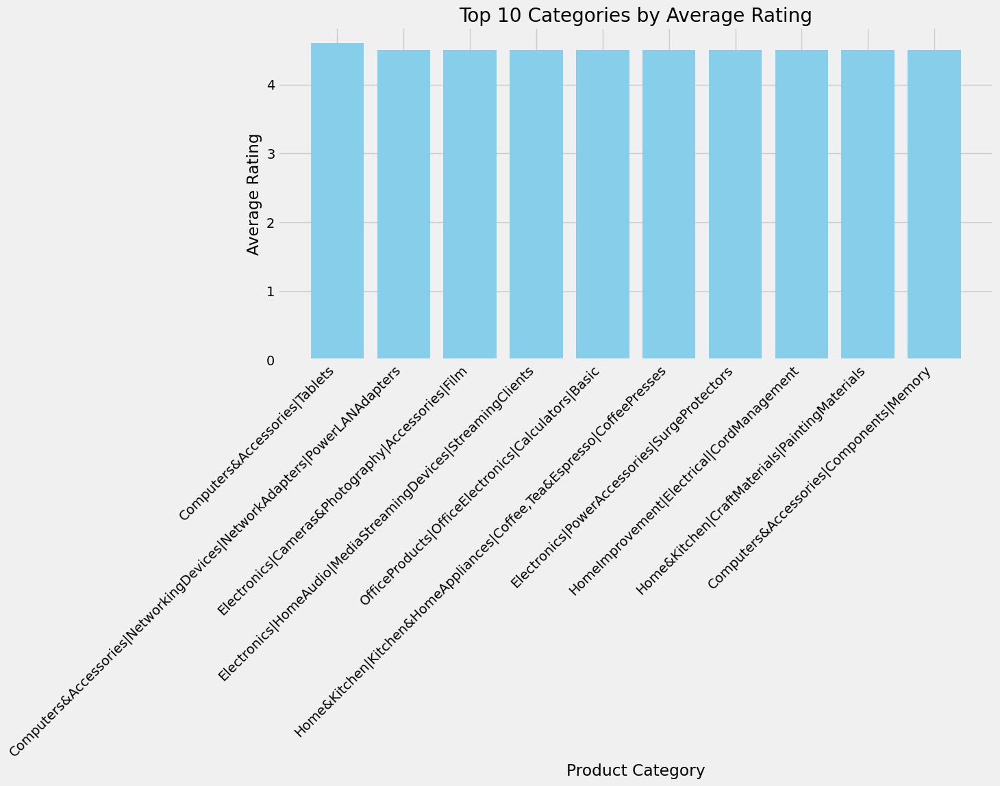

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv("amazon.csv")

# Convert 'rating' column to numeric, coercing errors to NaN
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

# Drop rows with NaN values in 'rating' column
df.dropna(subset=['rating'], inplace=True)

# Calculate the average rating for each product category
avg_rating_per_category = df.groupby('category')['rating'].mean().reset_index()

# Sort categories by average rating and select top 10
top_categories = avg_rating_per_category.sort_values(by='rating', ascending=False).head(10)

# Create a bar plot for the top 10 categories
plt.figure(figsize=(12, 6))
plt.bar(top_categories['category'], top_categories['rating'], color='skyblue')
plt.xlabel('Product Category')
plt.ylabel('Average Rating')
plt.title('Top 10 Categories by Average Rating')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


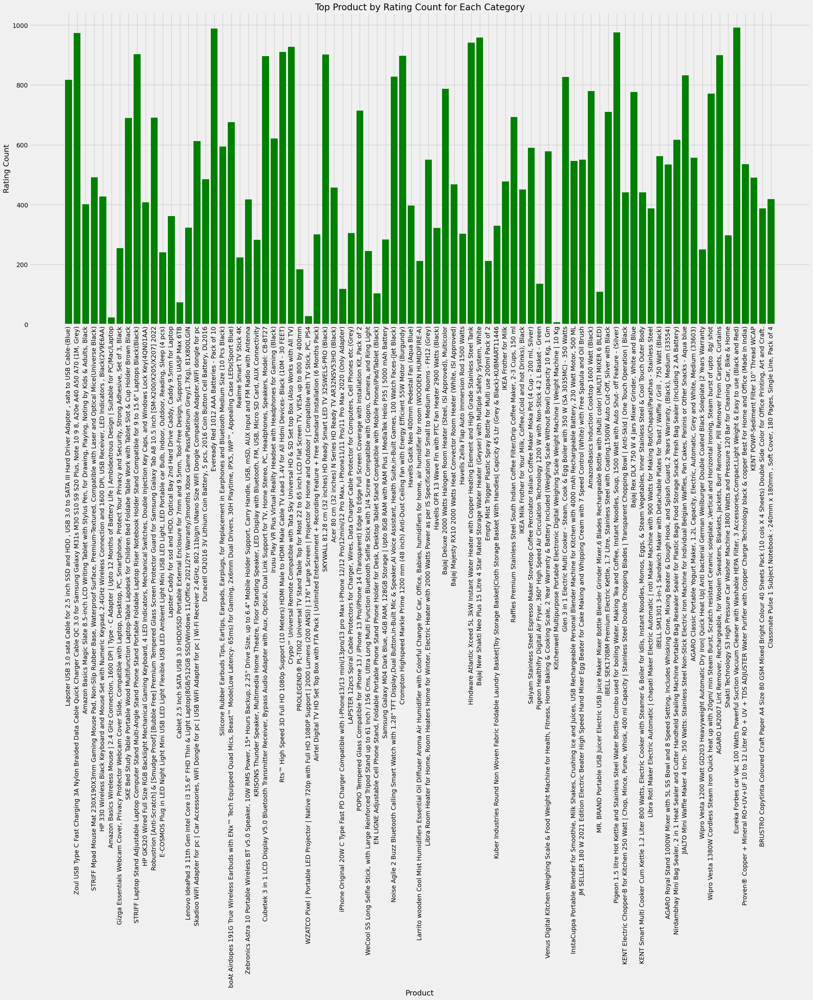

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv("amazon.csv")

# Convert 'rating_count' column to numeric, coercing errors to NaN
df['rating_count'] = pd.to_numeric(df['rating_count'], errors='coerce')

# Drop rows with NaN values in 'rating_count' column
df.dropna(subset=['rating_count'], inplace=True)

# Sort the entire DataFrame by 'rating_count' in descending order
df_sorted = df.sort_values(by='rating_count', ascending=False)

# Group the sorted DataFrame by category and select the top product for each category
top_products_by_category = df_sorted.groupby('category').first().reset_index()

# Create a bar plot
plt.figure(figsize=(28, 12))
plt.bar(top_products_by_category['product_name'], top_products_by_category['rating_count'], color='green')
plt.xlabel('Product')
plt.ylabel('Rating Count')
plt.title('Top Product by Rating Count for Each Category')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


In [ ]:
#3.What is the distribution of discounted prices vs. actual prices?

df.isnull().sum()

product_id             0.0
product_name           0.0
category               0.0
discounted_price       0.0
actual_price           0.0
discount_percentage    0.0
rating                 0.0
rating_count           0.0
about_product          0.0
user_id                0.0
user_name              0.0
review_id              0.0
review_title           0.0
review_content         0.0
img_link               0.0
product_link           0.0
Discount %             0.0
Price Difference       0.0
dtype: float64

In [ ]:
df.dtypes

product_id              object
product_name            object
category                object
discounted_price       float64
actual_price           float64
discount_percentage     object
rating                  object
rating_count            object
about_product           object
user_id                 object
user_name               object
review_id               object
review_title            object
review_content          object
img_link                object
product_link            object
Discount %             float64
Price Difference       float64
dtype: object

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   product_id           0 non-null      object 
 1   product_name         0 non-null      object 
 2   category             0 non-null      object 
 3   discounted_price     0 non-null      float64
 4   actual_price         0 non-null      float64
 5   discount_percentage  0 non-null      object 
 6   rating               0 non-null      object 
 7   rating_count         0 non-null      object 
 8   about_product        0 non-null      object 
 9   user_id              0 non-null      object 
 10  user_name            0 non-null      object 
 11  review_id            0 non-null      object 
 12  review_title         0 non-null      object 
 13  review_content       0 non-null      object 
 14  img_link             0 non-null      object 
 15  product_link         0 non-null      object 
 16  Discoun

In [ ]:
df['discounted_price']

Series([], Name: discounted_price, dtype: float64)

In [ ]:
# Assuming df is your DataFrame containing the prices
# Convert the 'actual_price' and 'discounted_price' columns to numeric
df['actual_price'] = pd.to_numeric(df['actual_price'], errors='coerce')
df['discounted_price'] = pd.to_numeric(df['discounted_price'], errors='coerce')


<Axes: >

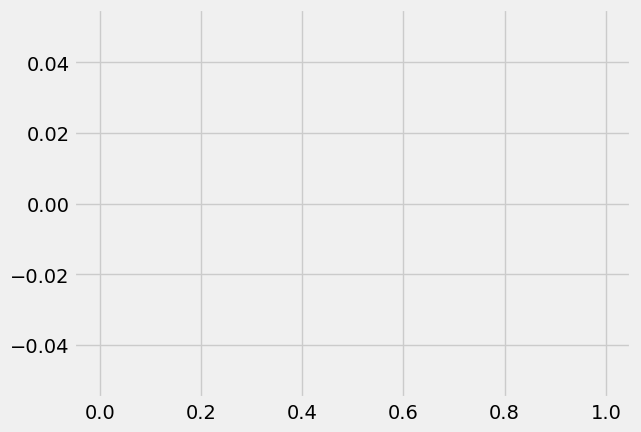

In [ ]:
import pandas as pd

# Create histograms
df["discounted_price"].hist(label="Discounted Price")
df["actual_price"].hist(label="Actual Price")

# Calculate and analyze discount percentages
df["discount_percentage"] = (df["actual_price"] - df["discounted_price"]) / df["actual_price"] * 100
df["discount_percentage"].describe()
df["discount_percentage"].hist(label="Discount Percentage")


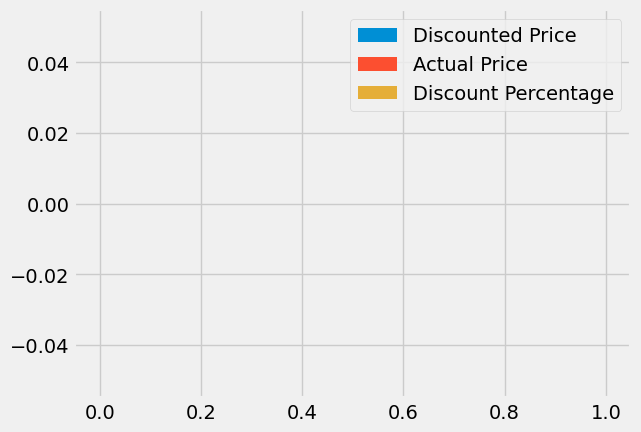

In [ ]:


import pandas as pd
import matplotlib.pyplot as plt


# Create histograms
df["discounted_price"].hist(label="Discounted Price")
df["actual_price"].hist(label="Actual Price")

# Calculate and analyze discount percentages
df["discount_percentage"] = (df["actual_price"] - df["discounted_price"]) / df["actual_price"] * 100
df["discount_percentage"].describe()
df["discount_percentage"].hist(label="Discount Percentage")

# Show the plots

plt.legend()
plt.show()

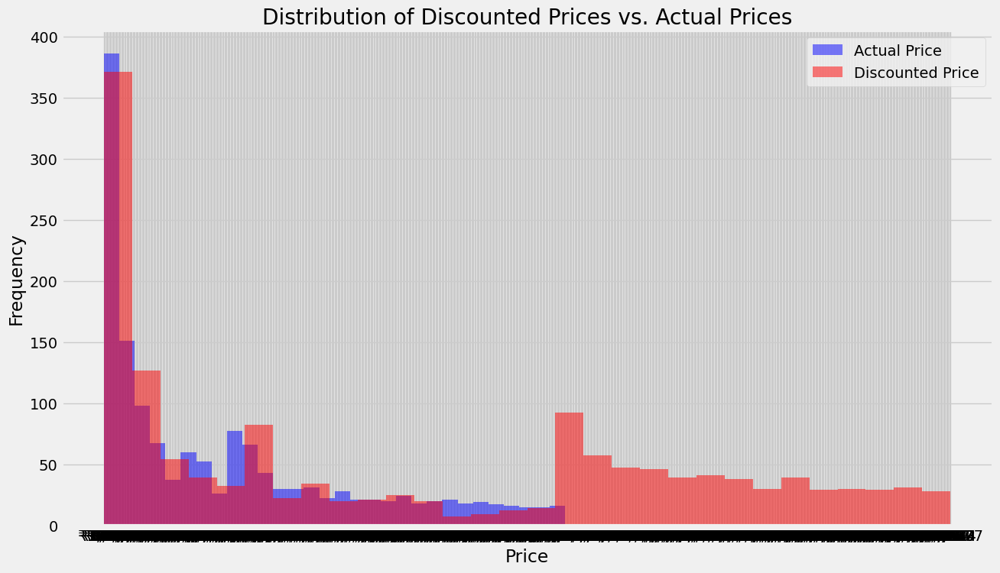

In [ ]:
#3.What is the distribution of discounted prices vs. actual prices?


import pandas as pd
import matplotlib.pyplot as plt

# Read your data
df = pd.read_csv("amazon.csv")

# Plotting
plt.figure(figsize=(14, 8))
plt.hist(df['actual_price'], bins=30, alpha=0.5, color='blue', label='Actual Price')
plt.hist(df['discounted_price'], bins=30, alpha=0.5, color='red', label='Discounted Price')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Distribution of Discounted Prices vs. Actual Prices')
plt.legend()
plt.show()

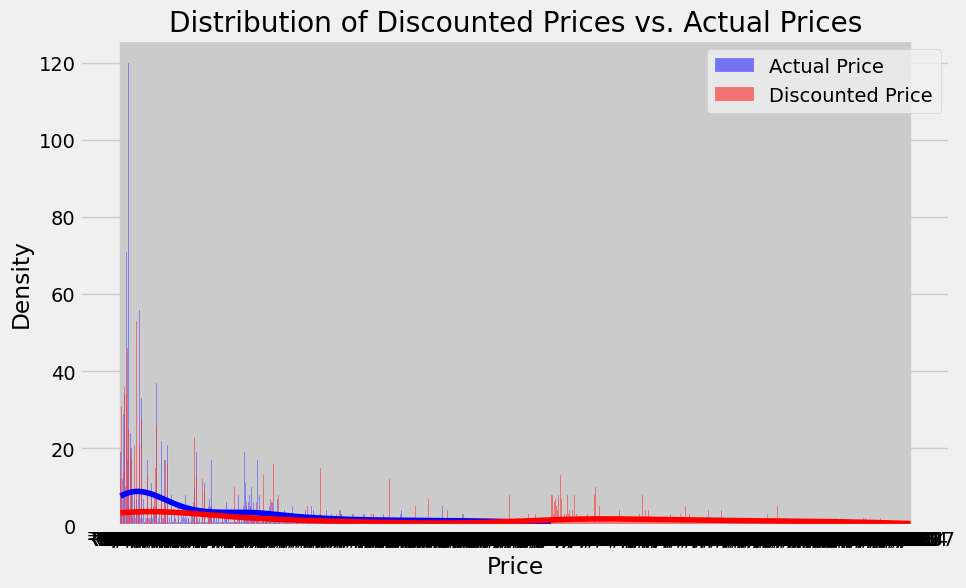

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Read your data
df = pd.read_csv("amazon.csv")

# Plotting
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='actual_price', bins=20, color='blue', kde=True, label='Actual Price')
sns.histplot(data=df, x='discounted_price', bins=20, color='red', kde=True, label='Discounted Price')
plt.xlabel('Price')
plt.ylabel('Density')
plt.title('Distribution of Discounted Prices vs. Actual Prices')
plt.legend()
plt.show()


Summary Statistics:
       actual_price  discounted_price  price_difference
count           0.0               0.0               0.0
mean            NaN               NaN               NaN
std             NaN               NaN               NaN
min             NaN               NaN               NaN
25%             NaN               NaN               NaN
50%             NaN               NaN               NaN
75%             NaN               NaN               NaN
max             NaN               NaN               NaN


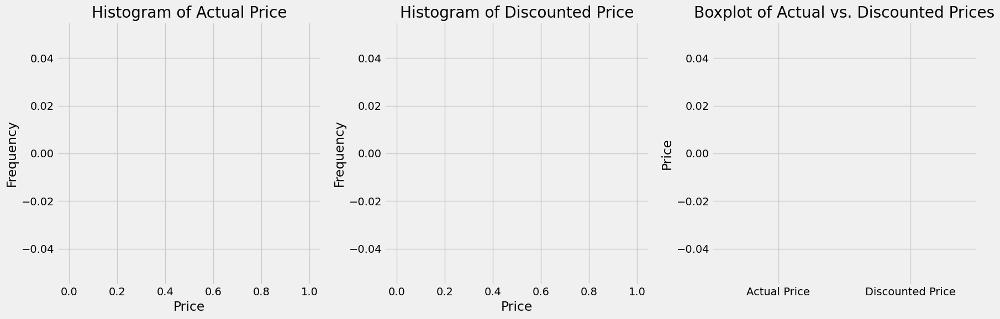

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv("amazon.csv")

# Convert 'actual_price' and 'discounted_price' columns to numeric
df['actual_price'] = pd.to_numeric(df['actual_price'], errors='coerce')
df['discounted_price'] = pd.to_numeric(df['discounted_price'], errors='coerce')

# Drop rows with NaN values
df.dropna(subset=['actual_price', 'discounted_price'], inplace=True)

# Calculate the difference between discounted price and actual price
df['price_difference'] = df['actual_price'] - df['discounted_price']

# Summary statistics
summary_stats = df[['actual_price', 'discounted_price', 'price_difference']].describe()
print("Summary Statistics:")
print(summary_stats)

# Visualize the distributions
plt.figure(figsize=(18, 6))

# Histogram of Actual Price
plt.subplot(1, 3, 1)
plt.hist(df['actual_price'], bins=20, color='skyblue', alpha=0.7)
plt.title('Histogram of Actual Price')
plt.xlabel('Price')
plt.ylabel('Frequency')

# Histogram of Discounted Price
plt.subplot(1, 3, 2)
plt.hist(df['discounted_price'], bins=20, color='salmon', alpha=0.7)
plt.title('Histogram of Discounted Price')
plt.xlabel('Price')
plt.ylabel('Frequency')

# Boxplot of Actual vs. Discounted Prices
plt.subplot(1, 3, 3)
plt.boxplot([df['actual_price'], df['discounted_price']], labels=['Actual Price', 'Discounted Price'])
plt.title('Boxplot of Actual vs. Discounted Prices')
plt.ylabel('Price')

plt.tight_layout()
plt.show()

In [ ]:
#4. How does the average discount percentage vary across categories?

df.columns



Index(['product_id', 'product_name', 'category', 'discounted_price',
       'actual_price', 'discount_percentage', 'rating', 'rating_count',
       'about_product', 'user_id', 'user_name', 'review_id', 'review_title',
       'review_content', 'img_link', 'product_link', 'Discount %'],
      dtype='object')

In [ ]:
df.discount_percentage


In [ ]:
df.discount_percentage.unique()

In [ ]:
df.category

0       Computers&Accessories|Accessories&Peripherals|...
1       Computers&Accessories|Accessories&Peripherals|...
2       Computers&Accessories|Accessories&Peripherals|...
3       Computers&Accessories|Accessories&Peripherals|...
4       Computers&Accessories|Accessories&Peripherals|...
                              ...                        
1460    Home&Kitchen|Kitchen&HomeAppliances|WaterPurif...
1461    Home&Kitchen|Kitchen&HomeAppliances|SmallKitch...
1462    Home&Kitchen|Heating,Cooling&AirQuality|RoomHe...
1463    Home&Kitchen|Heating,Cooling&AirQuality|Fans|E...
1464    Home&Kitchen|Kitchen&HomeAppliances|SmallKitch...
Name: category, Length: 1465, dtype: object

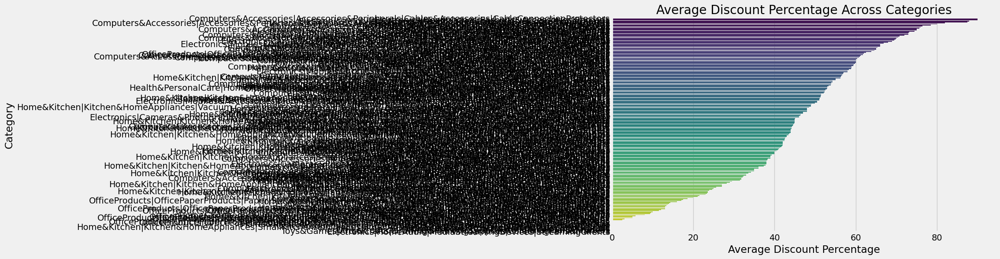

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv("amazon.csv")

# Parse the discount_percentage column to remove '%' sign and convert to numeric
df['discount_percentage'] = df['discount_percentage'].str.rstrip('%').astype(float)

# Extract unique categories
categories = df['category'].unique()

# Calculate average discount percentage for each category
average_discount_by_category = {}
for category in categories:
    avg_discount = df[df['category'] == category]['discount_percentage'].mean()
    average_discount_by_category[category] = avg_discount

# Convert dictionary to DataFrame for visualization
average_discount_df = pd.DataFrame(list(average_discount_by_category.items()), columns=['Category', 'Average_Discount_Percentage'])

# Sort the DataFrame by Average_Discount_Percentage
average_discount_df = average_discount_df.sort_values(by='Average_Discount_Percentage', ascending=False)

# Plot the average discount percentage across categories
plt.figure(figsize=(10, 6))
sns.barplot(x='Average_Discount_Percentage', y='Category', data=average_discount_df, palette='viridis')
plt.title('Average Discount Percentage Across Categories')
plt.xlabel('Average Discount Percentage')
plt.ylabel('Category')
plt.show()

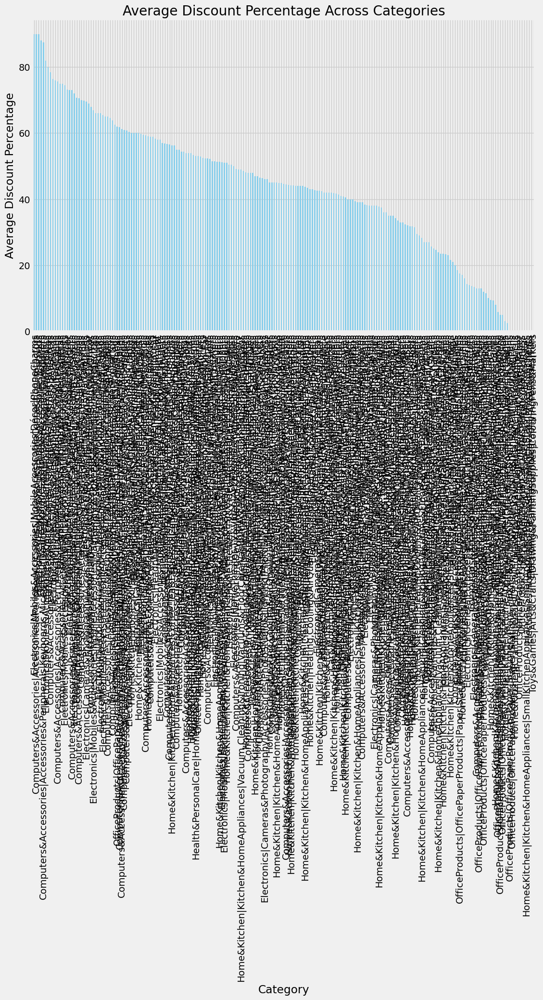

In [ ]:


import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv("amazon.csv")

# Parse the discount_percentage column to remove '%' sign and convert to numeric
df['discount_percentage'] = df['discount_percentage'].str.rstrip('%').astype(float)

# Calculate average discount percentage for each category
average_discount_by_category = df.groupby('category')['discount_percentage'].mean()

# Sort categories based on average discount percentage
average_discount_by_category = average_discount_by_category.sort_values(ascending=False)

# Plot the stacked bar chart
plt.figure(figsize=(12, 8))
average_discount_by_category.plot(kind='bar', stacked=True, color='skyblue')
plt.title('Average Discount Percentage Across Categories')
plt.xlabel('Category')
plt.ylabel('Average Discount Percentage')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.show()

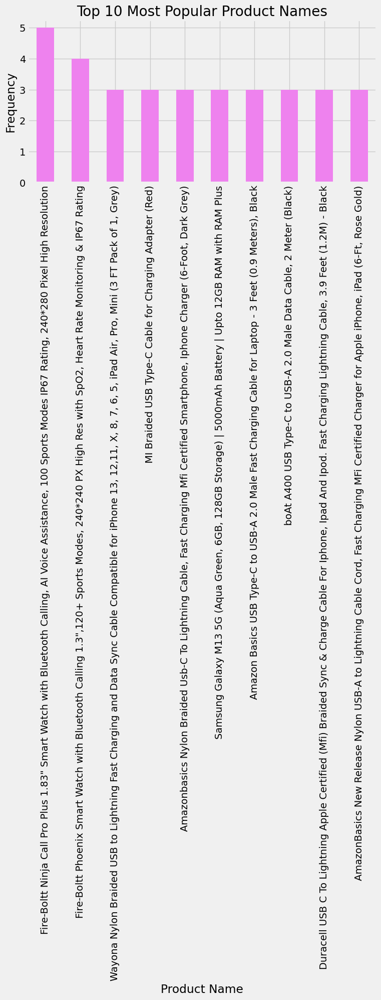

In [ ]:
#5. What are the most popular product names?


import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv("amazon.csv")

# Get the most popular product names
top_product_names = df['product_name'].value_counts().head(10)

# Plotting
plt.figure(figsize=(8, 4))
top_product_names.plot(kind='bar', color='violet')
plt.xlabel('Product Name')
plt.ylabel('Frequency')
plt.title('Top 10 Most Popular Product Names')
plt.tight_layout()
plt.show()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


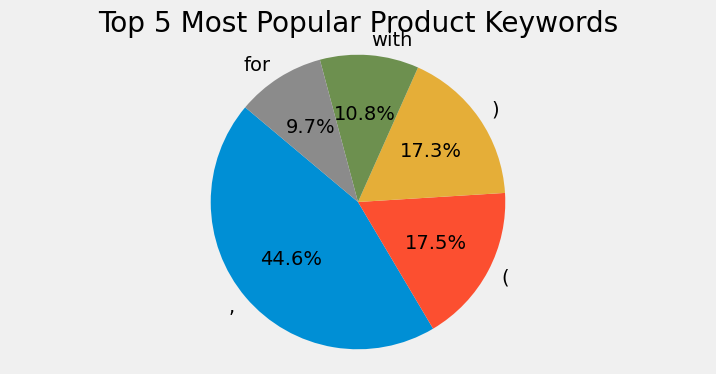

In [ ]:
#6. What are the most popular product keywords?



import pandas as pd
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from collections import Counter
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv("amazon.csv")

# Tokenize the product names and concatenate the tokens
all_tokens = []
for product_name in df['product_name']:
    tokens = word_tokenize(product_name.lower())  # Convert to lowercase
    all_tokens.extend(tokens)

# Count the occurrences of each token (keyword)
keyword_counts = Counter(all_tokens)

# Get the top 5 most popular keywords
top_keywords = keyword_counts.most_common(5)

# Extract keywords and their counts for plotting
keywords, counts = zip(*top_keywords)

# Plotting
plt.figure(figsize=(8, 4))
plt.pie(counts, labels=keywords, autopct='%1.1f%%', startangle=140)
plt.title('Top 5 Most Popular Product Keywords')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

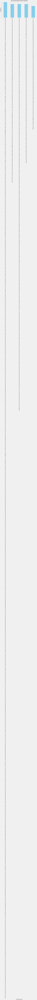

In [ ]:
#7. What are the most popular product reviews?


import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv("amazon.csv")

# Get the frequency of each product review
review_counts = df['review_content'].value_counts()

# Select the top 10 most popular reviews
top_reviews = review_counts.head(5)

# Plotting
plt.figure(figsize=(12, 6))
top_reviews.plot(kind='bar', color='skyblue')
plt.xlabel('Product Review')
plt.ylabel('Frequency')
plt.title('Top 5 Most Popular Product Reviews')
plt.tight_layout()
plt.show()

Correlation between discounted_price and rating: nan


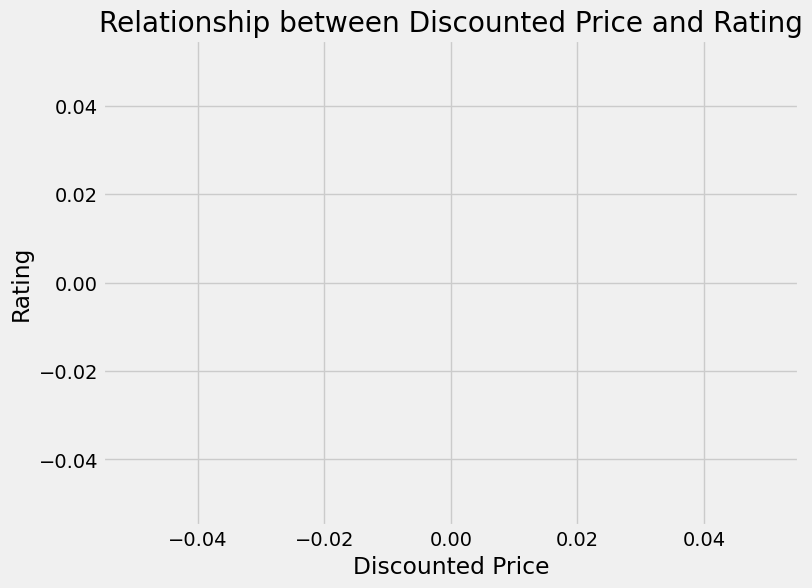

In [ ]:
# 8. What is the correlation between discounted_price and rating?


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame containing student data

# Convert 'discounted_price' column to numeric if it contains non-numeric values
df['discounted_price'] = pd.to_numeric(df['discounted_price'], errors='coerce')

# Convert 'rating' column to numeric if it contains non-numeric values
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

# Drop rows with missing values in either 'discounted_price' or 'rating' column
df.dropna(subset=['discounted_price', 'rating'], inplace=True)

# Calculate the correlation between 'discounted_price' and 'rating' columns
correlation = df['discounted_price'].corr(df['rating'])

print("Correlation between discounted_price and rating:", correlation)

# Plotting scatter plot to visualize the relationship
plt.figure(figsize=(8, 6))
sns.scatterplot(x='discounted_price', y='rating', data=df)
plt.title('Relationship between Discounted Price and Rating')
plt.xlabel('Discounted Price')
plt.ylabel('Rating')
plt.show()

In [ ]:
# 9. What are the Top 5 categories based on the highest ratings?



import pandas as pd

# Read your data
df = pd.read_csv("amazon.csv")

# Convert 'rating' column to numeric
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

# Drop rows with NaN values in 'rating' column
df.dropna(subset=['rating'], inplace=True)

# Group by 'category' and calculate the average rating for each category
avg_rating_per_category = df.groupby('category')['rating'].mean().reset_index()

# Sort the categories based on the average rating in descending order and select the top 5
top_categories = avg_rating_per_category.nlargest(5, 'rating')

print(top_categories)

                                             category  rating
57                      Computers&Accessories|Tablets     4.6
38            Computers&Accessories|Components|Memory     4.5
48  Computers&Accessories|NetworkingDevices|Networ...     4.5
62   Electronics|Cameras&Photography|Accessories|Film     4.5
81  Electronics|HomeAudio|MediaStreamingDevices|St...     4.5


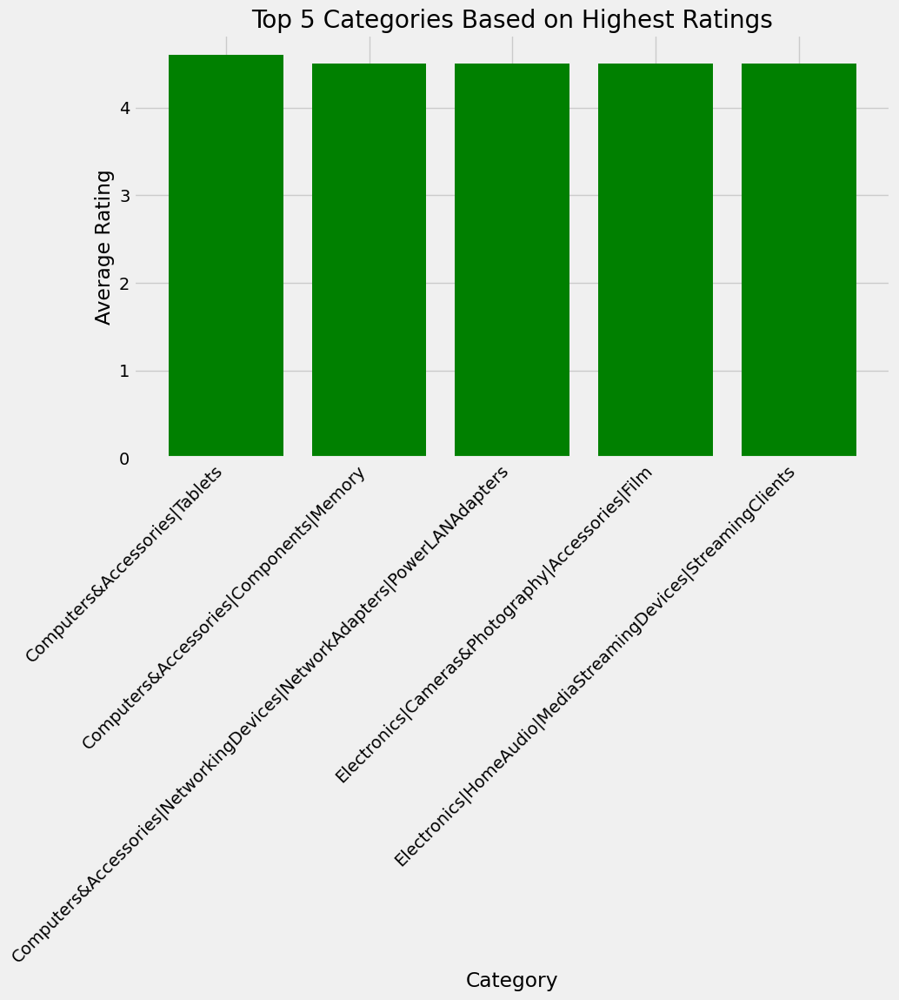

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt

# Read your data
df = pd.read_csv("amazon.csv")

# Convert 'rating' column to numeric
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

# Drop rows with NaN values in 'rating' column
df.dropna(subset=['rating'], inplace=True)

# Group by 'category' and calculate the average rating for each category
avg_rating_per_category = df.groupby('category')['rating'].mean().reset_index()

# Sort the categories based on the average rating in descending order and select the top 5
top_categories = avg_rating_per_category.nlargest(5, 'rating')

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(top_categories['category'], top_categories['rating'], color='green')
plt.xlabel('Category')
plt.ylabel('Average Rating')
plt.title('Top 5 Categories Based on Highest Ratings')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
# 10. Identify any potential areas for improvement or optimization based on the data analysis.

In [30]:
#Spotify data


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



In [31]:
#1.Load the dataframe and ensure data quality by checking for missing values and duplicate rows.
 #Handle missing values and remove duplicate rows if necessary.

 # Load the Spotify DataFrame
spotify_df = pd.read_csv('spotify.csv')

print(spotify_df.columns)





Index(['Artist', 'Track Name', 'Popularity', 'Duration (ms)', 'Track ID'], dtype='object')


In [32]:
# Display the first few rows of the DataFrame
print("Original DataFrame:")
print(spotify_df.head())

Original DataFrame:
  Artist                               Track Name  Popularity  Duration (ms)  \
0  Drake  Rich Baby Daddy (feat. Sexyy Red & SZA)          92         319191   
1  Drake                                One Dance          91         173986   
2  Drake                       IDGAF (feat. Yeat)          90         260111   
3  Drake     First Person Shooter (feat. J. Cole)          88         247444   
4  Drake            Jimmy Cooks (feat. 21 Savage)          88         218364   

                 Track ID  
0  1yeB8MUNeLo9Ek1UEpsyz6  
1  1zi7xx7UVEFkmKfv06H8x0  
2  2YSzYUF3jWqb9YP9VXmpjE  
3  7aqfrAY2p9BUSiupwk3svU  
4  3F5CgOj3wFlRv51JsHbxhe  


In [33]:
# Check null/missing values
print("\nMissing values:")
print(spotify_df.isnull().sum())


# Check duplicate rows
print("\nDuplicate rows:")
duplicate_rows = spotify_df[spotify_df.duplicated()]
print(duplicate_rows)


Missing values:
Artist           0
Track Name       0
Popularity       0
Duration (ms)    0
Track ID         0
dtype: int64

Duplicate rows:
              Artist                                         Track Name  \
39      Travis Scott                             MELTDOWN (feat. Drake)   
52      Travis Scott                   TELEKINESIS (feat. SZA & Future)   
72         21 Savage                                            née-nah   
73             Drake                      Jimmy Cooks (feat. 21 Savage)   
76             Drake                                          Rich Flex   
131            Drake               First Person Shooter (feat. J. Cole)   
170     Metro Boomin            Trance (with Travis Scott & Young Thug)   
182   D-Block Europe                                           Overseas   
210      Post Malone      Sunflower - Spider-Man: Into the Spider-Verse   
212     Metro Boomin  Annihilate (Spider-Man: Across the Spider-Vers...   
222          Cardi B             

In [34]:
# Handle missing values
# drop rows with missing values
spotify_df = spotify_df.dropna()

In [35]:
# Remove duplicate rows
spotify_df = spotify_df.drop_duplicates()



In [36]:
# Display the first few rows of the cleaned DataFrame
print("\nCleaned DataFrame:")
print(spotify_df.head())


Cleaned DataFrame:
  Artist                               Track Name  Popularity  Duration (ms)  \
0  Drake  Rich Baby Daddy (feat. Sexyy Red & SZA)          92         319191   
1  Drake                                One Dance          91         173986   
2  Drake                       IDGAF (feat. Yeat)          90         260111   
3  Drake     First Person Shooter (feat. J. Cole)          88         247444   
4  Drake            Jimmy Cooks (feat. 21 Savage)          88         218364   

                 Track ID  
0  1yeB8MUNeLo9Ek1UEpsyz6  
1  1zi7xx7UVEFkmKfv06H8x0  
2  2YSzYUF3jWqb9YP9VXmpjE  
3  7aqfrAY2p9BUSiupwk3svU  
4  3F5CgOj3wFlRv51JsHbxhe  


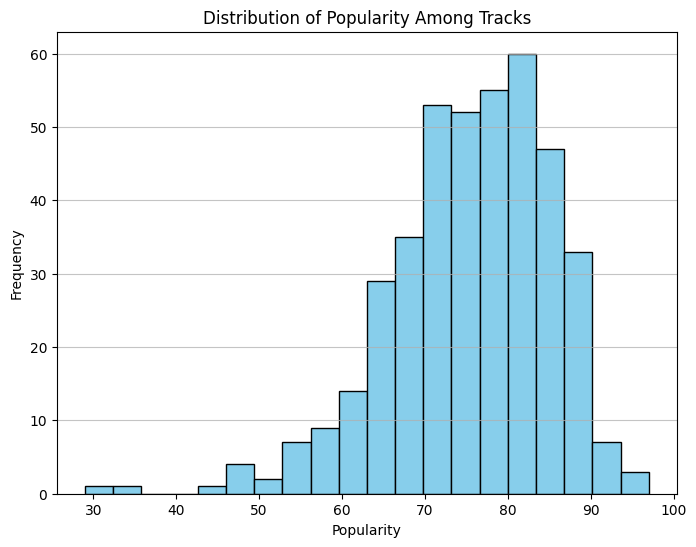

In [37]:
#2.What is the distribution of popularity among the tracks in the dataset? Visualize it using a histogram

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.hist(spotify_df['Popularity'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Popularity')
plt.ylabel('Frequency')
plt.title('Distribution of Popularity Among Tracks')
plt.grid(axis='y', alpha=0.75)
plt.show()

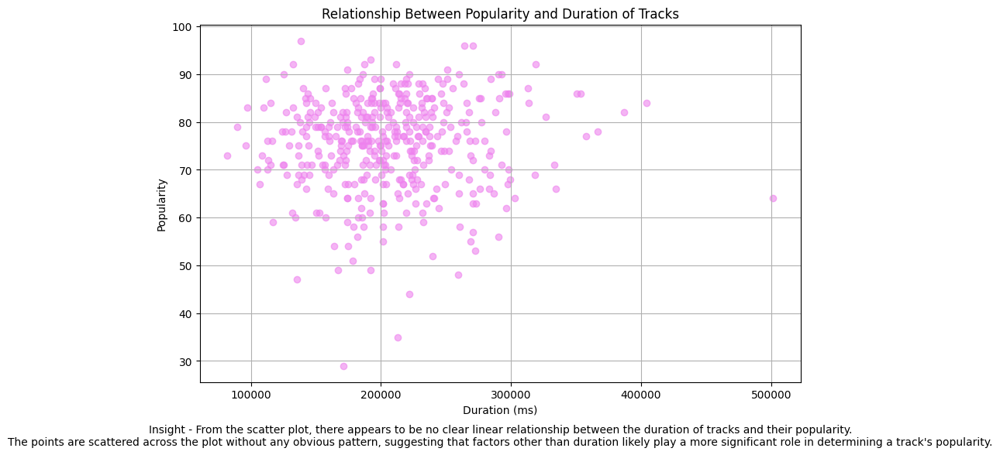

In [38]:
#3.Is there any relationship between the popularity and the duration of tracks? Explore this using a scatter plot.

import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
plt.scatter(spotify_df['Duration (ms)'], spotify_df['Popularity'], color='violet', alpha=0.6)
plt.xlabel('Duration (ms)')
plt.ylabel('Popularity')
plt.title('Relationship Between Popularity and Duration of Tracks')
plt.grid(True)

plt.text(0.5, -0.15, "Insight - From the scatter plot, there appears to be no clear linear relationship between the duration of tracks and their popularity.\n"
                     "The points are scattered across the plot without any obvious pattern, suggesting that factors other than duration likely play a more significant role in determining a track's popularity.",
         horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)


plt.show()

<ipython-input-50-156faaf25daa>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y='Artist', data=spotify_df, order=artist_track_count.index, palette='viridis')


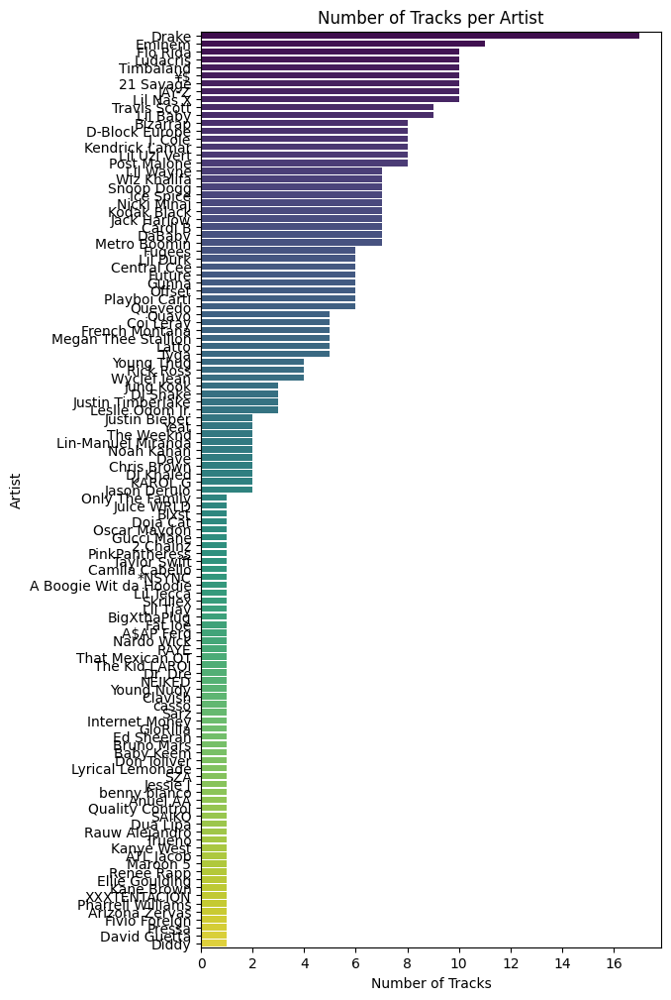

The artist with the highest number of tracks is Drake with 17 tracks.


In [50]:
#4.Which artist has the highest number of tracks in the dataset? Display the count of tracks for each artist using a countplot.

artist_track_count = spotify_df['Artist'].value_counts()

# Find the artist with the highest number of tracks
artist_with_most_tracks = artist_track_count.idxmax()


# Display the count of tracks for each artist using a countplot
plt.figure(figsize=(6, 12))
sns.countplot(y='Artist', data=spotify_df, order=artist_track_count.index, palette='viridis')
plt.xlabel('Number of Tracks')
plt.ylabel('Artist')
plt.title('Number of Tracks per Artist')
plt.xticks(rotation=0)  # Rotate the labels on the y-axis to a horizontal orientation
plt.show()

print(f"The artist with the highest number of tracks is {artist_with_most_tracks} with {artist_track_count.max()} tracks.")

In [52]:
#4.What are the top 5 least popular tracks in the dataset? Provide the artist name and track name for each


# Sort the DataFrame by popularity in ascending order to get the least popular tracks first
least_popular_tracks = spotify_df.sort_values('Popularity').head(5)

# Display the artist name, track name, and popularity for each of the least popular tracks
for index, row in least_popular_tracks.iterrows():
    print(f"Artist: {row['Artist']}, Track: {row['Track Name']}, Popularity: {row['Popularity']}")


Artist: Pressa, Track: Attachments (feat. Coi Leray), Popularity: 29
Artist: Justin Bieber, Track: Intentions, Popularity: 35
Artist: French Montana, Track: Splash Brothers, Popularity: 44
Artist: Lil Baby, Track: On Me - Remix, Popularity: 47
Artist: Wyclef Jean, Track: 911 (feat. Mary J. Blige), Popularity: 48


In [55]:
#6.Among the top 5 most popular artists, which artist has the highest popularity on average?
 #Calculate and display the average popularity for each artist.




# Calculate the average popularity for each artist
average_popularity = spotify_df.groupby('Artist')['Popularity'].mean()

# Find the top 5 most popular artists
top_5_artists = average_popularity.nlargest(5)

# Display the average popularity for each artist
print("Average Popularity for Each Artist:")
print(average_popularity)

# Identify the artist among the top 5 most popular artists with the highest popularity on average
artist_highest_avg_popularity = top_5_artists.idxmax()
highest_avg_popularity = top_5_artists.max()

print(f"\nAmong the top 5 most popular artists, '{artist_highest_avg_popularity}' has the highest popularity on average with a popularity score of {highest_avg_popularity}.")

Average Popularity for Each Artist:
Artist
*NSYNC                    67.00
2 Chainz                  72.00
21 Savage                 83.80
A Boogie Wit da Hoodie    80.00
A$AP Ferg                 69.00
                          ...  
Young Nudy                67.00
Young Thug                73.75
benny blanco              72.00
cassö                     92.00
¥$                        85.10
Name: Popularity, Length: 115, dtype: float64

Among the top 5 most popular artists, 'cassö' has the highest popularity on average with a popularity score of 92.0.


In [57]:
#7.For the top 5 most popular artists, what are their most popular tracks? List the track name for each artist.

# Calculate the average popularity for each artist
average_popularity = spotify_df.groupby('Artist')['Popularity'].mean()

# Find the top 5 most popular artists
top_5_artists = average_popularity.nlargest(5)

# Find the most popular tracks for each of the top 5 artists
for artist in top_5_artists.index:
    artist_tracks = spotify_df[spotify_df['Artist'] == artist]
    most_popular_track = artist_tracks.loc[artist_tracks['Popularity'].idxmax(), 'Track Name']
    print(f"Artist: {artist}, Most Popular Track: {most_popular_track}")

Artist: cassö, Most Popular Track: Prada
Artist: Trueno, Most Popular Track: Mamichula - con Nicki Nicole
Artist: David Guetta, Most Popular Track: Baby Don't Hurt Me
Artist: Travis Scott, Most Popular Track: FE!N (feat. Playboi Carti)
Artist: ¥$, Most Popular Track: CARNIVAL


In [54]:



 #. Identify the top 5 popular artists based on the mean popularity of their tracks.Show the mean popularity of
#tracks for the top 5 popular artists Using BarPlot.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Spotify dataset
spotify_df = pd.read_csv('spotify.csv')

# Calculate the mean popularity for each artist
artist_popularity = spotify_df.groupby('Artist')['Popularity'].mean().sort_values(ascending=False)

# Get the top 5 popular artists
top_5_artists = artist_popularity.head(5)



In [ ]:
artist_popularity

Artist
cassö             92.000000
Trueno            89.000000
David Guetta      87.000000
Travis Scott      87.000000
¥$                86.090909
                    ...    
RAYE              55.000000
Wyclef Jean       54.500000
Arizona Zervas    54.000000
Justin Bieber     49.000000
Pressa            29.000000
Name: Popularity, Length: 115, dtype: float64

In [ ]:
top_5_artists

Artist
cassö           92.000000
Trueno          89.000000
David Guetta    87.000000
Travis Scott    87.000000
¥$              86.090909
Name: Popularity, dtype: float64

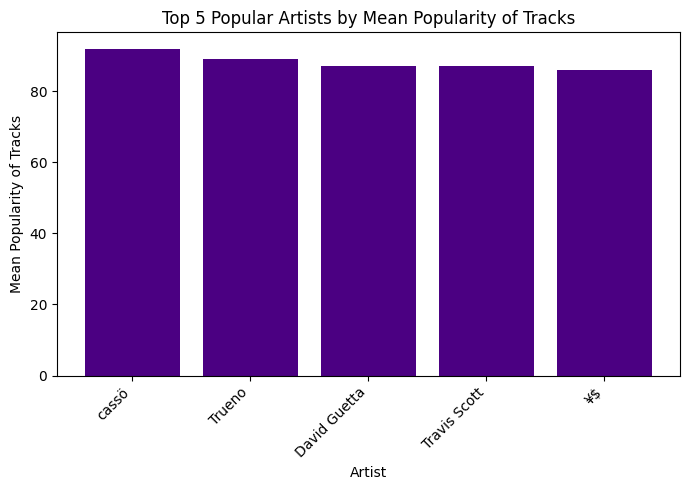

In [ ]:
# Created a bar plot
plt.figure(figsize=(7, 5))
plt.bar(top_5_artists.index, top_5_artists.values, color='indigo')
plt.xlabel('Artist')
plt.ylabel('Mean Popularity of Tracks')
plt.title('Top 5 Popular Artists by Mean Popularity of Tracks')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
#Determine the top 5 popular songs based on their popularity ratings.Display the popularity ratings of the top
#5 popular songs using BarPlot.

In [ ]:
# Load the Spotify dataset
spotify_df = pd.read_csv('spotify.csv')

# Sort the dataset by popularity in descending order
top_songs = spotify_df.sort_values(by='Popularity', ascending=False).head(5)


In [ ]:
top_songs

,Artist,Track Name,Popularity,Duration (ms),Track ID
40,Jack Harlow,Lovin On Me,97,138411,4xhsWYTOGcal8zt0J161CU
280,¥$,CARNIVAL,96,264324,3w0w2T288dec0mgeZZqoNN
70,21 Savage,redrum,96,270697,52eIcoLUM25zbQupAZYoFh
260,¥$,CARNIVAL,96,264324,3w0w2T288dec0mgeZZqoNN
30,Travis Scott,FE!N (feat. Playboi Carti),93,191700,42VsgItocQwOQC3XWZ8JNA


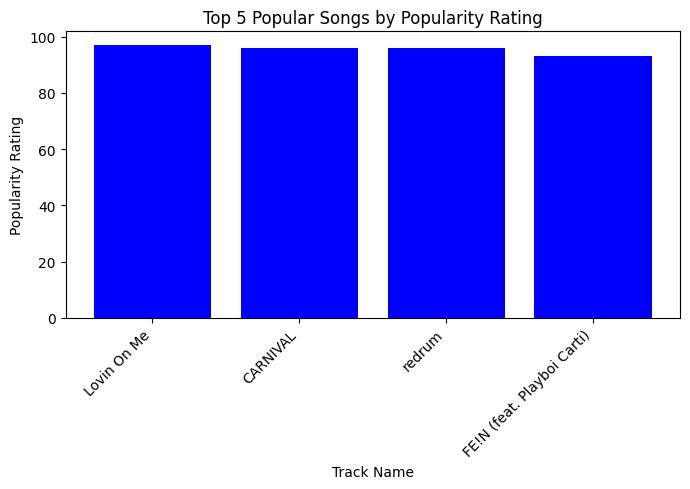

In [ ]:

# bar plot for top 5 songs
plt.figure(figsize=(7, 5))
plt.bar(top_songs['Track Name'], top_songs['Popularity'], color='blue')
plt.xlabel('Track Name')
plt.ylabel('Popularity Rating')
plt.title('Top 5 Popular Songs by Popularity Rating')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:

 #. Identify the top 5 longest songs among the tracks of the top 5 popular artists.Represent the duration of the
#top 5 longest songs among the tracks of the top 5 popular artists using BarPlot.

In [ ]:


import pandas as pd
import matplotlib.pyplot as plt

# Load the Spotify dataset
spotify_df = pd.read_csv('spotify.csv')

# Calculate the mean popularity for each artist
artist_popularity = spotify_df.groupby('Artist')['Popularity'].mean().sort_values(ascending=False)

# Get the top 5 popular artists
top_5_artists = artist_popularity.head(5).index.tolist()

# Filter the dataset to include only tracks by the top 5 popular artists
top_5_artists_tracks = spotify_df[spotify_df['Artist'].isin(top_5_artists)]

# Sort the filtered dataset by duration in descending order to get the top 5 longest songs
top_5_longest_songs = top_5_artists_tracks.sort_values(by='Duration (ms)', ascending=False).head(5)



In [ ]:
artist_popularity

Artist
cassö             92.000000
Trueno            89.000000
David Guetta      87.000000
Travis Scott      87.000000
¥$                86.090909
                    ...    
RAYE              55.000000
Wyclef Jean       54.500000
Arizona Zervas    54.000000
Justin Bieber     49.000000
Pressa            29.000000
Name: Popularity, Length: 115, dtype: float64

In [ ]:
top_5_artists

['cassö', 'Trueno', 'David Guetta', 'Travis Scott', '¥$']

In [ ]:
top_5_artists_tracks

,Artist,Track Name,Popularity,Duration (ms),Track ID
7,Travis Scott,MELTDOWN (feat. Drake),86,246133,67nepsnrcZkowTxMWigSbb
30,Travis Scott,FE!N (feat. Playboi Carti),93,191700,42VsgItocQwOQC3XWZ8JNA
31,Travis Scott,I KNOW ?,92,211582,6wsqVwoiVH2kde4k4KKAFU
32,Travis Scott,MY EYES,91,251249,4kjI1gwQZRKNDkw1nI475M
33,Travis Scott,goosebumps,89,243836,6gBFPUFcJLzWGx4lenP6h2
37,Travis Scott,SICKO MODE,87,312820,2xLMifQCjDGFmkHkpNLD9h
38,Travis Scott,TELEKINESIS (feat. SZA & Future),86,353754,1i9lZvlaDdWDPyXEE95aiq
39,Travis Scott,MELTDOWN (feat. Drake),86,246133,67nepsnrcZkowTxMWigSbb
52,Travis Scott,TELEKINESIS (feat. SZA & Future),86,353754,1i9lZvlaDdWDPyXEE95aiq
140,cassö,Prada,92,132359,59NraMJsLaMCVtwXTSia8i


In [ ]:
top_5_longest_songs

,Artist,Track Name,Popularity,Duration (ms),Track ID
173,Travis Scott,SKITZO (feat. Young Thug),78,366592,0bkV1iQHSxBaksUqgEkcbc
38,Travis Scott,TELEKINESIS (feat. SZA & Future),86,353754,1i9lZvlaDdWDPyXEE95aiq
52,Travis Scott,TELEKINESIS (feat. SZA & Future),86,353754,1i9lZvlaDdWDPyXEE95aiq
37,Travis Scott,SICKO MODE,87,312820,2xLMifQCjDGFmkHkpNLD9h
263,¥$,BACK TO ME,86,295471,1icgLGTpX2fQXKRe4D7w2b


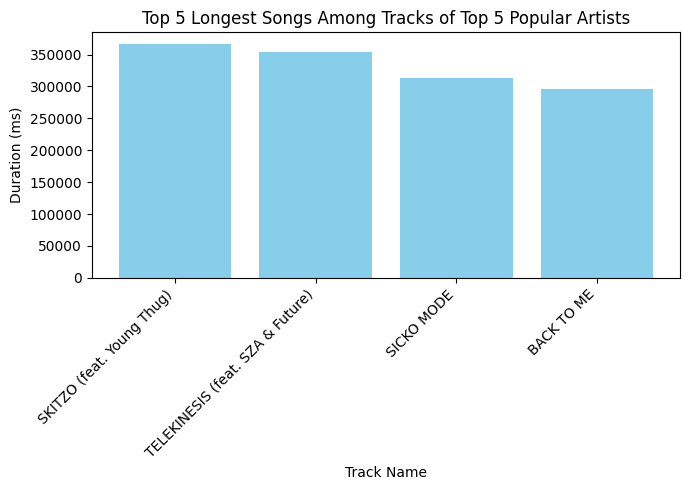

In [ ]:
# bar plot
plt.figure(figsize=(7, 5))
plt.bar(top_5_longest_songs['Track Name'], top_5_longest_songs['Duration (ms)'], color='skyblue')
plt.xlabel('Track Name')
plt.ylabel('Duration (ms)')
plt.title('Top 5 Longest Songs Among Tracks of Top 5 Popular Artists')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

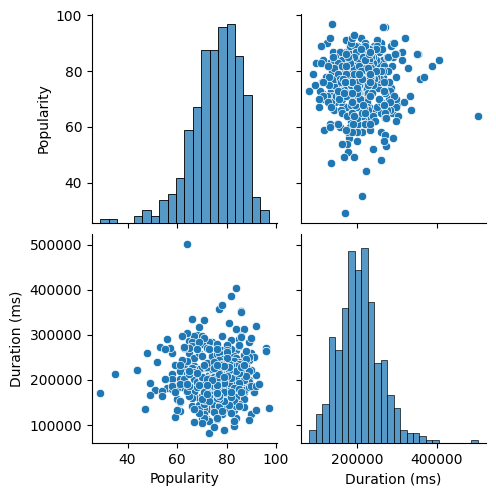

In [58]:
#8.Visualize relationships between multiple numerical variables simultaneously using a pair plot.

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
spotify_data = pd.read_csv('spotify.csv')

# Create a pair plot
sns.pairplot(spotify_data[['Popularity', 'Duration (ms)']])
plt.show()


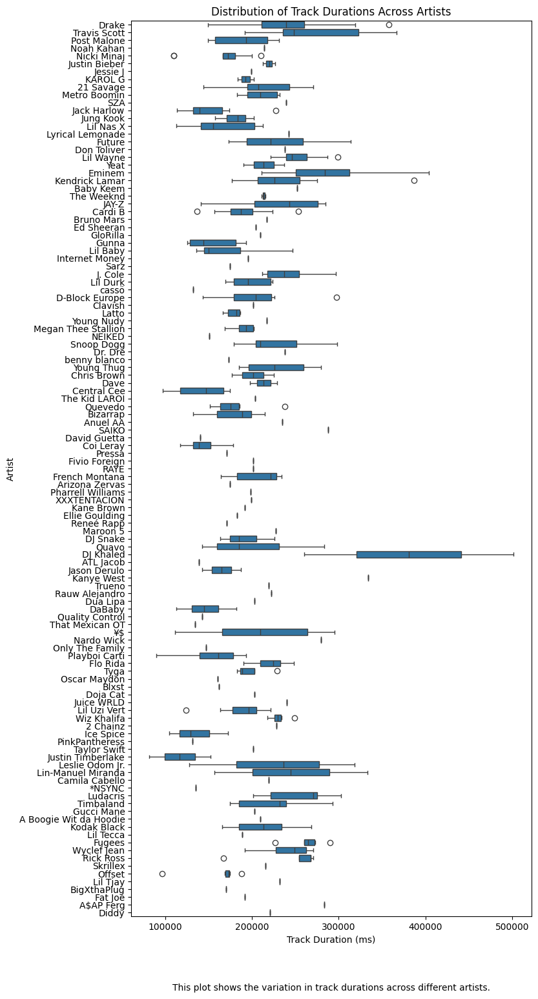

In [68]:
#9.Does the duration of tracks vary significantly across different artists?
#Explore this visually using a box plot or violin plot.


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
spotify_data = pd.read_csv('spotify.csv')

# Create a box plot of track duration for each artist
plt.figure(figsize=(8, 18))
sns.boxplot(x='Duration (ms)', y='Artist', data=spotify_data)
plt.xlabel('Track Duration (ms)')
plt.ylabel('Artist')
plt.title('Distribution of Track Durations Across Artists')
plt.text(0.5, -0.08, "This plot shows the variation in track durations across different artists.",
         horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=10)
plt.show()

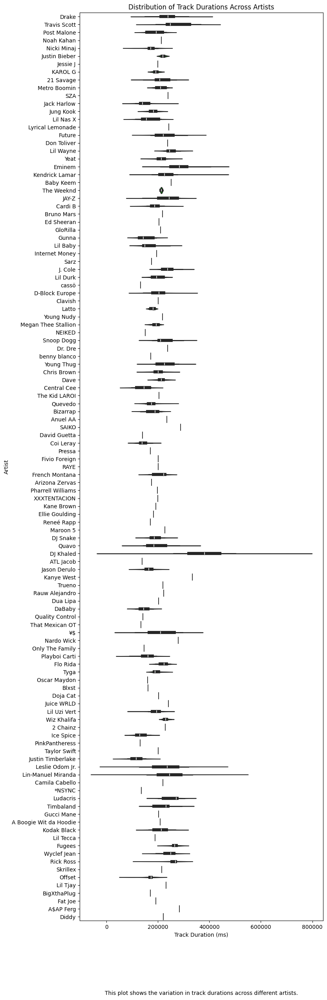

In [76]:
plt.figure(figsize=(8, 30))
sns.violinplot(x='Duration (ms)', y='Artist', data=spotify_data, color='green')
plt.xlabel('Track Duration (ms)')
plt.ylabel('Artist')
plt.title('Distribution of Track Durations Across Artists')
plt.text(0.5, -0.08, "This plot shows the variation in track durations across different artists.",
         horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=10)
plt.show()

In [ ]:
#10.How does the distribution of track popularity vary for different artists?
#Visualize this using a swarm plot or a violin plot.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 33.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 44.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 27.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 50.0% of the points cannot be plac

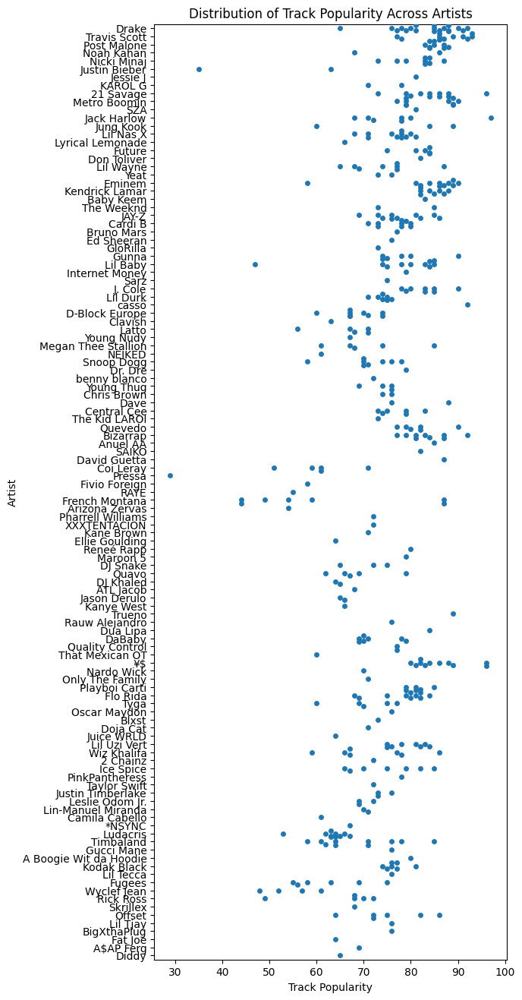

In [73]:
plt.figure(figsize=(6, 16))
sns.swarmplot(x='Popularity', y='Artist', data=spotify_data)
plt.xlabel('Track Popularity')
plt.ylabel('Artist')
plt.title('Distribution of Track Popularity Across Artists')
plt.show()

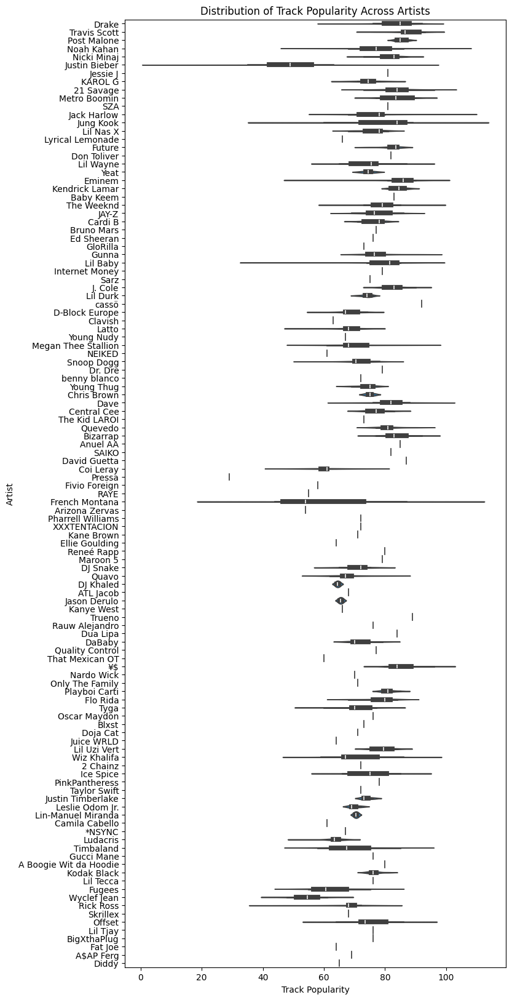

In [77]:

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
spotify_data = pd.read_csv('spotify.csv')

# Create a violin plot of track popularity for each artist
plt.figure(figsize=(8, 20))
sns.violinplot(x='Popularity', y='Artist', data=spotify_data)
plt.xlabel('Track Popularity')
plt.ylabel('Artist')
plt.title('Distribution of Track Popularity Across Artists')
plt.show()